# Imports

In [1]:
import os
from pathlib import Path
import pandas as pd

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import pyfolio as pf
from pyfolio.plotting import plot_rolling_returns,plot_rolling_sharpe
from pyfolio.timeseries import forecast_cone_bootstrap

In [4]:
import warnings
warnings.filterwarnings("ignore")

In [5]:
from backtester import BackTester

In [6]:
data_store=Path("../Prepared_Data_Store")

# BackTesting

## Trading Strategy-I:

### Here we will long the top returns and short the bottom returns values at a particular day as predicted by our Combined Model

In [7]:
trading_strategy={
    "strategy":"returns_based",
    "values":{}
}

In [8]:
backtester=BackTester(
    n_longs=20,
    n_shorts=20,
    min_positions=10,
    capital_base=1e6,
    commission_cost=0.00075,
    commission_min_trade_cost=0.01,
    slippage_spread=0.0,
    predictions_file=os.path.join(data_store,"factors.csv"),
    predictions_column_name="Combined_Factor",
    trading_strategy=trading_strategy
)

In [9]:
results=backtester.run_backtesting()

[INFO]: Model predictions loaded...
[INFO]: Missing Date Values added in Model Predictions...
[INFO]: Model Data Loader created...
[INFO]: Backtesting started for trading strategy-I...
[INFO]: Backtesting completed...


### Performance analysis using Pyfolio

#### Loading Benchmark Data

In [10]:
benchmark_data=pd.read_csv(
    os.path.join(data_store,"sp500_data.csv"),
    parse_dates=["date"],
    index_col=["date"]
)

In [11]:
benchmark_data=benchmark_data.sp500_returns.tz_localize("UTC")

#### Extracting information from Zipline Results

In [12]:
returns,positions,transactions=pf.utils.extract_rets_pos_txn_from_zipline(results)

#### Plotting Rolling Returns and Sharpe Ratio

In [13]:
LIVE_DATE="2016-02-24"

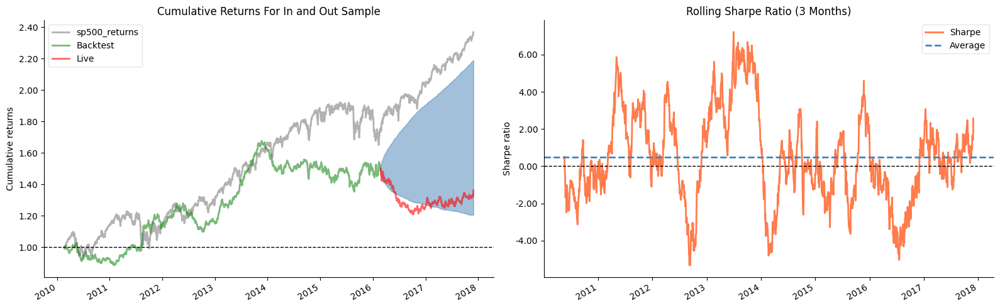

In [14]:
fig,axes=plt.subplots(ncols=2,figsize=(16,5))

plot_rolling_returns(
    returns,
    factor_returns=benchmark_data,
    live_start_date=LIVE_DATE,
    logy=False,
    cone_std=2,
    legend_loc="best",
    volatility_match=False,
    cone_function=forecast_cone_bootstrap,
    ax=axes[0]
)

plot_rolling_sharpe(returns,rolling_window=63,ax=axes[1])

axes[0].set_title("Cumulative Returns For In and Out Sample")
axes[1].set_title("Rolling Sharpe Ratio (3 Months)")

sns.despine()
fig.tight_layout()

#### Full Tear Sheet

Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,27.91,2013-11-21,2016-10-06,NaT,NaN
1,14.10,2012-05-25,2012-10-15,2013-02-14,190
2,14.00,2010-05-17,2011-02-02,2011-08-16,327
3,7.71,2011-11-30,2011-12-22,2012-03-22,82
4,6.69,2011-09-27,2011-10-12,2011-11-02,27


Stress Events,mean,min,max
US downgrade/European Debt Crisis,0.70%,-1.84%,3.46%
Fukushima,0.04%,-0.87%,0.66%
EZB IR Event,-0.05%,-0.97%,1.19%
Flash Crash,0.32%,-0.15%,0.68%
Apr14,0.03%,-1.68%,2.01%
Oct14,-0.08%,-1.37%,2.19%
Fall2015,0.08%,-1.40%,3.15%
Recovery,0.02%,-3.02%,3.46%
New Normal,0.02%,-2.59%,3.15%


Top 10 long positions of all time,max
sid,
NFLX,28.36%
PCG,24.69%
URI,23.48%
WTW,21.52%
NRG,21.28%
VRTX,20.62%
VRSN,20.16%
BLDR,19.94%
AOS,19.77%


Top 10 short positions of all time,max
sid,
NFLX,-34.10%
URI,-28.76%
NRG,-25.70%
VRTX,-25.40%
EW,-20.37%
DGX,-19.94%
DXCM,-19.89%
AMD,-19.73%
ROK,-19.60%


Top 10 positions of all time,max
sid,
NFLX,34.10%
URI,28.76%
NRG,25.70%
VRTX,25.40%
PCG,24.69%
WTW,21.52%
EW,20.37%
VRSN,20.16%
BLDR,19.94%


Summary stats,All trades,Short trades,Long trades
Total number of round_trips,75753.00,37042.00,38711.00
Percent profitable,0.50,0.48,0.51
Winning round_trips,37684.00,17760.00,19924.00
Losing round_trips,37434.00,18987.00,18447.00
Even round_trips,635.00,295.00,340.00


PnL stats,All trades,Short trades,Long trades
Total profit,$551660.17,$-1049730.58,$1601390.75
Gross profit,$25681075.68,$12007041.26,$13674034.43
Gross loss,$-25129415.51,$-13056771.84,$-12072643.68
Profit factor,$1.02,$0.92,$1.13
Avg. trade net profit,$7.28,$-28.34,$41.37
Avg. winning trade,$681.48,$676.07,$686.31
Avg. losing trade,$-671.30,$-687.67,$-654.45
Ratio Avg. Win:Avg. Loss,$1.02,$0.98,$1.05
Largest winning trade,$48180.39,$37318.14,$48180.39
Largest losing trade,$-34934.31,$-16486.32,$-34934.31


Duration stats,All trades,Short trades,Long trades
Avg duration,1 days 13:39:43.319234881,1 days 13:37:39.888504940,1 days 13:41:41.428327865
Median duration,1 days 00:00:00,1 days 00:00:00,1 days 00:00:00
Longest duration,265 days 23:00:00,265 days 23:00:00,147 days 00:00:00
Shortest duration,0 days 00:00:00,0 days 00:00:00,0 days 00:00:00


Return stats,All trades,Short trades,Long trades
Avg returns all round_trips,0.00%,-0.00%,0.00%
Avg returns winning,0.05%,0.05%,0.05%
Avg returns losing,-0.05%,-0.05%,-0.05%
Median returns all round_trips,0.00%,-0.00%,0.00%
Median returns winning,0.03%,0.03%,0.03%
Median returns losing,-0.03%,-0.03%,-0.03%
Largest winning trade,3.41%,2.58%,3.41%
Largest losing trade,-2.68%,-1.25%,-2.68%


Symbol stats,A,ACGL,ACN,ADI,ADM,ADP,ADSK,AEE,AEP,AES,AFL,AIG,AIZ,AJG,ALB,ALGN,ALL,AMAT,AMD,AME,AMGN,AMP,AMT,AON,AOS,APA,APD,APH,ARE,ATO,AVB,AVGO,AVY,AWK,AXP,AZO,BA,BAC,BAX,BBY,BDX,BEN,BG,BIIB,BK,BLDR,BLK,BMY,BR,BRO,BSX,BXP,C,CAG,CAH,CAT,CB,CCI,CCL,CDNS,CF,CHD,CHRW,CI,CINF,CL,CLX,CME,CMG,CMI,CMS,CNC,CNP,COF,COO,COP,CPB,CPRT,CPT,CRL,CRM,CSCO,CSGP,CSX,CTAS,CTSH,CVS,CVX,D,DAL,DE,DECK,DG,DGX,DHI,DHR,DIS,DLR,DLTR,DOV,DPZ,DRI,DTE,DUK,DVA,DVN,DXCM,EA,EBAY,ECL,ED,EFX,EIX,EL,EMN,EMR,EOG,EQIX,EQR,EQT,ERIE,ES,ESS,ETN,ETR,EW,EXC,EXPD,EXPE,EXR,F,FCX,FDS,FDX,FE,FFIV,FICO,FIS,FITB,FOX,FOXA,FRT,FTNT,GD,GE,GILD,GIS,GLW,GOOGL,GPC,GPN,GRMN,GS,GWW,HAL,HAS,HBAN,HD,HIG,HOLX,HON,HPQ,HRL,HSIC,HST,HSY,HUM,IBM,ICE,IDXX,IEX,IFF,INCY,INTU,IP,IPG,IR,IRM,ISRG,IT,ITW,IVZ,JBHT,JBL,JCI,JKHY,JNJ,JPM,K,KEY,KIM,KLAC,KMB,KMX,KO,KR,L,LDOS,LEN,LH,LII,LKQ,LLY,LMT,LNT,LRCX,LUV,LVS,LYV,MA,MAA,MAR,MAS,MCD,MCHP,MCK,MCO,MDLZ,MDT,MET,MGM,MHK,MKC,MKTX,MLM,MMC,MNST,MO,MOH,MOS,MPWR,MRK,MS,MSCI,MSFT,MSI,MTB,MTD,MU,NDAQ,NDSN,NEE,NEM,NFLX,NI,NKE,NOC,NRG,NSC,NTAP,NTRS,NUE,NVDA,NVR,O,ODFL,OKE,OMC,ORCL,ORLY,OXY,PAYX,PCAR,PCG,PEG,PEP,PFE,PFG,PG,PGR,PH,PHM,PKG,PLD,PM,PNC,PNR,PNW,PODD,POOL,PPG,PPL,PRU,PSA,PWR,RCL,REG,REGN,RF,RJF,RL,RMD,ROK,ROL,ROP,ROST,RSG,SBAC,SBUX,SCHW,SHW,SJM,SLB,SMCI,SNA,SNPS,SO,SPG,SRE,STE,STLD,STT,STX,STZ,SWK,SWKS,SYK,SYY,T,TAP,TDG,TDY,TECH,TEL,TER,TGT,TJX,TMO,TMUS,TRMB,TROW,TSCO,TSN,TTWO,TXN,TXT,TYL,UAL,UDR,UHS,ULTA,UNH,UNP,UPS,URI,USB,V,VLO,VMC,VRSK,VRSN,VRTX,VTR,VZ,WAB,WAT,WBA,WDC,WEC,WFC,WM,WMB,WMT,WRB,WSM,WST,WTW,WY,WYNN,XEL,XOM,YUM,ZBH,ZBRA
Avg returns all round_trips,0.01%,0.00%,-0.00%,0.01%,0.00%,0.00%,0.00%,-0.00%,-0.00%,0.00%,-0.01%,-0.03%,0.00%,0.01%,-0.00%,-0.01%,-0.01%,-0.01%,-0.01%,-0.00%,-0.00%,0.01%,0.00%,-0.00%,-0.00%,-0.01%,-0.00%,0.01%,-0.00%,-0.00%,-0.01%,0.01%,0.01%,0.01%,0.00%,-0.00%,0.00%,0.03%,0.00%,0.01%,0.00%,-0.00%,0.01%,0.00%,-0.00%,0.03%,0.01%,-0.01%,0.00%,-0.00%,0.01%,-0.01%,0.01%,0.00%,-0.00%,0.00%,0.00%,-0.00%,-0.00%,-0.00%,0.00%,0.00%,-0.00%,0.00%,-0.01%,-0.00%,-0.00%,-0.00%,-0.00%,0.00%,0.00%,0.00%,-0.00%,0.01%,-0.01%,-0.00%,-0.00%,-0.00%,0.01%,-0.00%,0.01%,-0.00%,-0.00%,-0.00%,0.00%,0.00%,-0.00%,0.00%,0.00%,-0.01%,0.00%,0.01%,0.00%,0.01%,-0.00%,-0.00%,0.02%,0.00%,0.00%,0.00%,0.01%,-0.00%,0.00%,-0.00%,0.00%,-0.01%,-0.00%,-0.01%,0.02%,0.01%,-0.00%,0.01%,-0.00%,-0.01%,0.01%,0.00%,0.00%,0.00%,0.00%,-0.00%,-0.00%,-0.01%,-0.01%,-0.04%,-0.00%,-0.00%,0.00%,-0.00%,-0.01%,0.00%,0.01%,-0.02%,-0.01%,-0.00%,-0.00%,-0.00%,0.01%,0.00%,-0.01%,0.00%,-0.00%,-0.01%,-0.00%,0.00%,0.01%,0.00%,0.01%,0.01%,0.02%,0.01%,0.00%,-0.00%,0.01%,0.00%,-0.01%,0.01%,0.02%,0.00%,0.01%,0.00%,-0.00%,0.00%,0.00%,-0.02%,0.00%,0.00%,0.01%,0.01%,0.01%,0.00%,-0.02%,-0.00%,0.00%,-0.00%,-0.00%,-0.01%,0.00%,-0.00%,0.00%,-0.00%,-0.01%,0.02%,0.01%,0.01%,-0.00%,0.01%,0.01%,-0.00%,0.00%,-0.00%,0.01%,-0.00%,-0.00%,-0.00%,0.00%,0.00%,-0.00%,0.00%,-0.01%,-0.00%,-0.01%,0.01%,-0.01%,0.00%,0.01%,-0.00%,0.00%,0.01%,-0.00%,0.01%,-0.00%,0.00%,0.02%,-0.00%,-0.01%,-0.00%,-0.00%,0.00%,-0.01%,-0.00%,0.00%,0.01%,0.00%,-0.01%,-0.00%,0.01%,0.01%,-0.00%,0.00%,0.01%,0.00%,0.01%,0.02%,-0.00%,0.01%,0.01%,0.01%,0.00%,0.01%,0.01%,0.01%,-0.00%,0.01%,0.01%,-0.00%,0.00%,0.00%,-0.02%,-0.01%,-0.01%,0.01%,0.00%,0.00%,0.00%,0.00%,-0.00%,-0.00%,-0.01%,-0.00%,0.00%,-0.00%,-0.01%,-0.00%,0.00%,0.00%,0.00%,0.01%,-0.00%,-0.00%,-0.00%,0.00%,-0.00%,-0.01%,-0.00%,0.00%,0.01%,0.00%,-0.01%,-0.01%,0.01%,-0.00%,-0.00%,-0.02%,0.00%,0.01%,0.00%,-0.01%,0.01%,0.01%,0.00%,0.01%,-0.00%,-0.02%,0.00%,0.00%,-0.00%,-0.00%,-0.00%,0.00%,0.00%,-0.00%,-0.00%,-0.01%,-0.01%,-0.01%,0.00%,-0.00%,0.01%,-0.00%,0.00%,0.00%,0.00%,0.01%,0.01%,0.00%,0.01%,-0.00%,-0.00%,-0.00%,0.01%,0.01%,-0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,-0.01%,0.00%,0.01%,0.00%,-0.00%,0.00%,-0.00%,0.01%,0.01%,-0.00%,-0.00%,0.00%,-0.00%,-0.00%,0.00%,0.00%,-0.01%,0.02%,0.00%,0.00%,-0.02%,-0.01%,0.01%,0.01%,-0.01%,-0.01%,0.00%,0.01%,0.01%,-0.00%,-0.01%,0.00%,0.01%,-0.00%,0.01%,0.00%,-0.00%,0.01%,-0.00%,-0.01%,0.01%,0.01%,-0.00%,0.01%,0.00%,0.01%,-0.00%
Avg returns winning,0

Profitability (PnL / PnL total) per name,
symbol,
BLDR,16.70%
BBY,10.60%
GIS,9.10%
EBAY,8.10%
PWR,7.94%
MSI,7.23%
MNST,6.94%
MAS,6.85%
BAC,6.84%


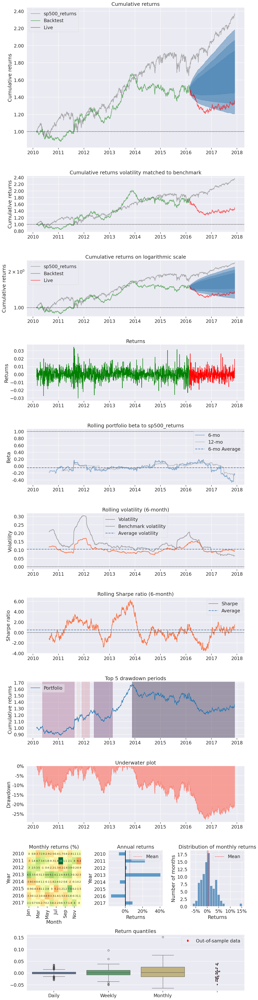

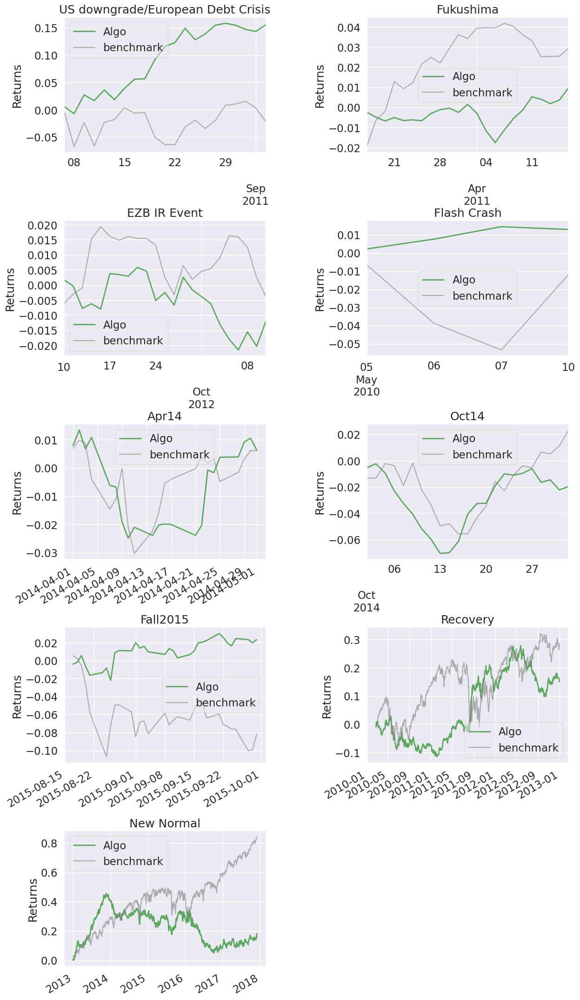

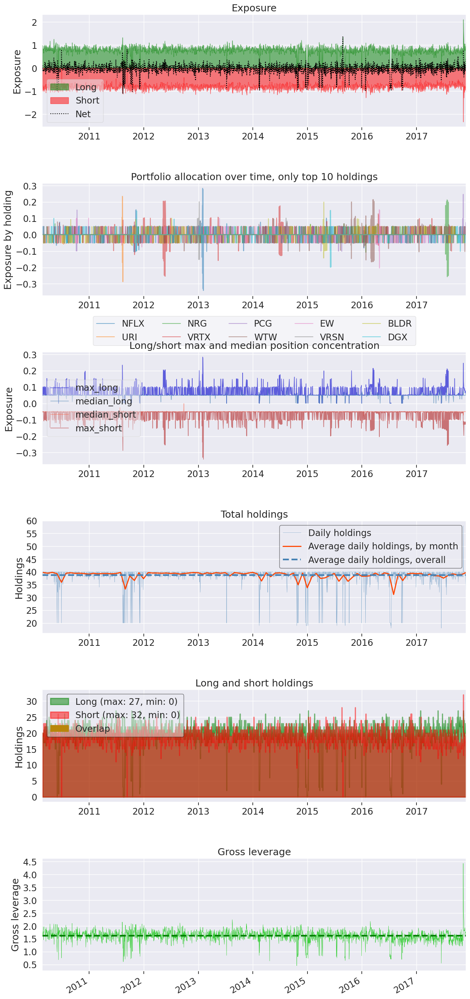

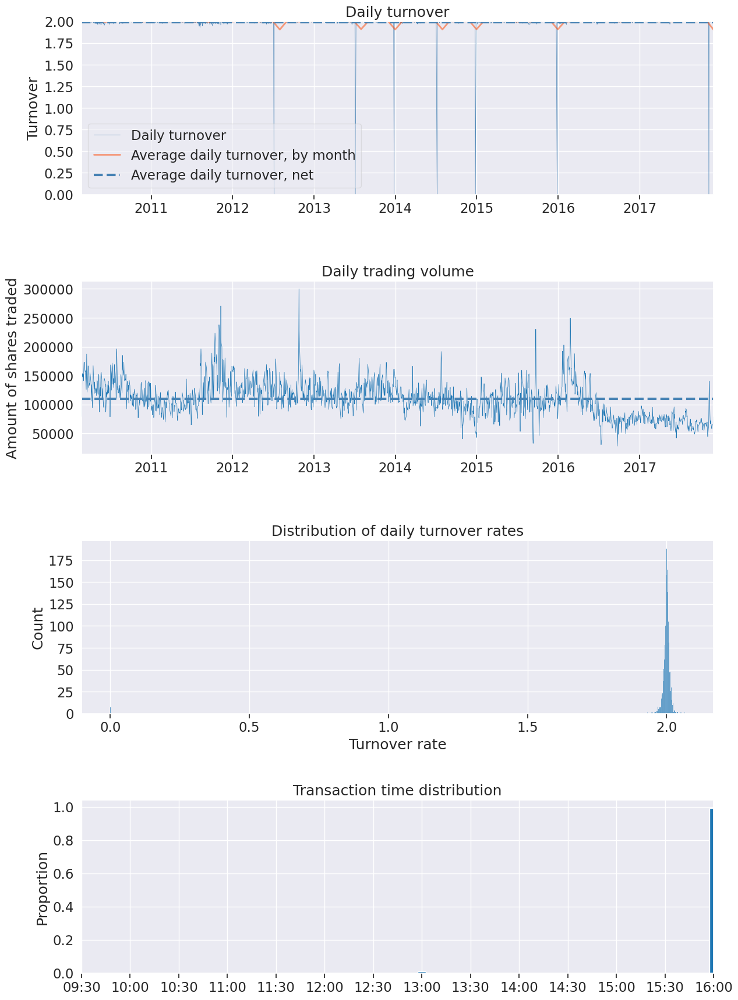

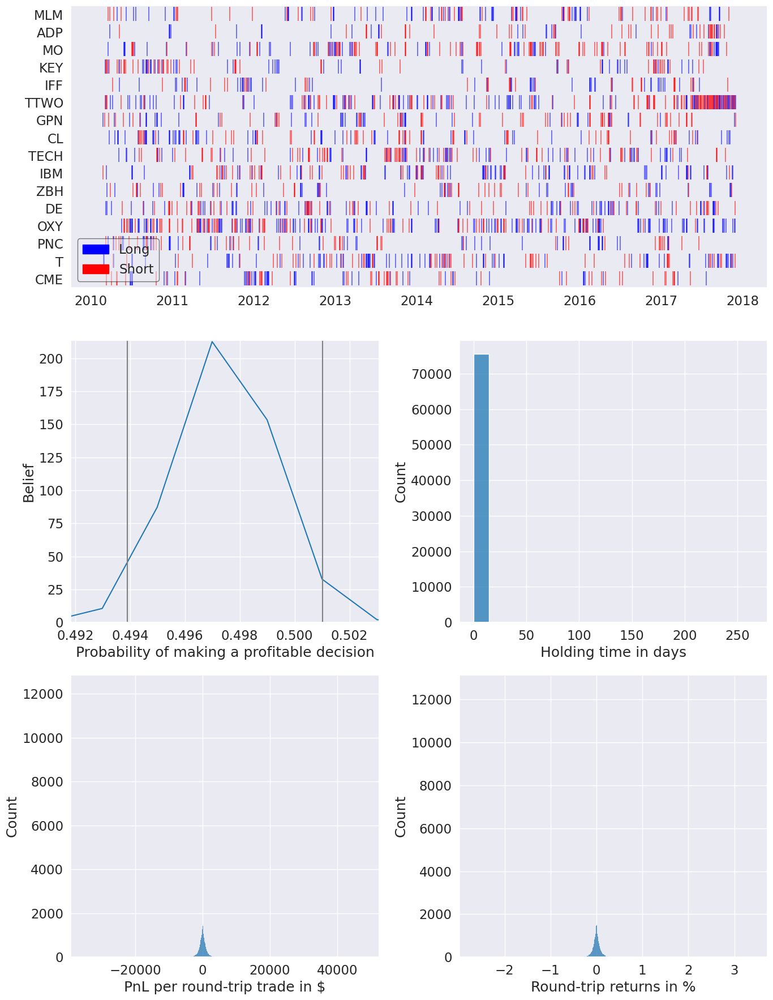

In [15]:
pf.create_full_tear_sheet(
    returns,
    positions=positions,
    transactions=transactions,
    benchmark_rets=benchmark_data,
    live_start_date=LIVE_DATE,
    round_trips=True
)

## Trading Strategy-II:

### As per the Signal Evaluation of the Combined Model Factors, we will long and short predictions in quantiles 5 and 2 respectively.

In [16]:
trading_strategy={
    "strategy":"quantile_based",
    "values":{
        "quantile_long":5,
        "quantile_short":2
}

}

In [17]:
backtester=BackTester(
    n_longs=20,
    n_shorts=20,
    min_positions=10,
    capital_base=1e6,
    commission_cost=0.00075,
    commission_min_trade_cost=0.01,
    slippage_spread=0.0,
    predictions_file=os.path.join(data_store,"factors.csv"),
    predictions_column_name="Combined_Factor",
    trading_strategy=trading_strategy
)

In [18]:
results=backtester.run_backtesting()

[INFO]: Model predictions loaded...
[INFO]: Missing Date Values added in Model Predictions...
[INFO]: Model Data Loader created...
[INFO]: Backtesting started for trading strategy-II...
[INFO]: Backtesting completed...


### Performance analysis using Pyfolio

#### Extracting information from Zipline Results

In [19]:
returns,positions,transactions=pf.utils.extract_rets_pos_txn_from_zipline(results)

#### Plotting Rolling Returns and Sharpe Ratio

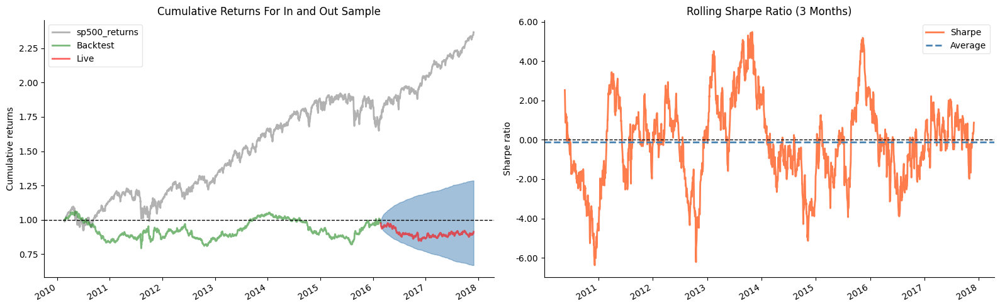

In [20]:
fig,axes=plt.subplots(ncols=2,figsize=(16,5))

plot_rolling_returns(
    returns,
    factor_returns=benchmark_data,
    live_start_date=LIVE_DATE,
    logy=False,
    cone_std=2,
    legend_loc="best",
    volatility_match=False,
    cone_function=forecast_cone_bootstrap,
    ax=axes[0]
)

plot_rolling_sharpe(returns,rolling_window=63,ax=axes[1])

axes[0].set_title("Cumulative Returns For In and Out Sample")
axes[1].set_title("Rolling Sharpe Ratio (3 Months)")

sns.despine()
fig.tight_layout()

#### Full Tear Sheet

Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,25.36,2010-05-07,2011-08-08,NaT,NaN
1,2.27,2010-04-19,2010-05-03,2010-05-07,15
2,1.47,2010-04-09,2010-04-15,2010-04-19,7
3,1.10,2010-03-04,2010-03-19,2010-03-22,13
4,0.74,2010-03-25,2010-03-26,2010-03-31,5


Stress Events,mean,min,max
US downgrade/European Debt Crisis,0.42%,-6.61%,7.28%
Fukushima,0.08%,-0.60%,0.92%
EZB IR Event,-0.19%,-1.02%,0.48%
Flash Crash,0.50%,-0.52%,1.52%
Apr14,0.02%,-1.27%,0.80%
Oct14,-0.29%,-1.59%,1.81%
Fall2015,0.21%,-0.79%,2.33%
Recovery,-0.02%,-6.61%,7.28%
New Normal,0.01%,-2.43%,3.47%


Top 10 long positions of all time,max
sid,
WTW,17.45%
HSY,17.33%
CF,16.66%
SNPS,16.44%
REGN,16.14%
DUK,15.84%
ULTA,15.63%
INTU,15.59%
JCI,15.57%


Top 10 short positions of all time,max
sid,
LII,-19.94%
BG,-19.83%
ULTA,-15.27%
OKE,-15.19%
BIIB,-15.00%
ED,-14.94%
DAL,-14.70%
PHM,-13.61%
OXY,-13.45%


Top 10 positions of all time,max
sid,
LII,19.94%
BG,19.83%
WTW,17.45%
HSY,17.33%
CF,16.66%
SNPS,16.44%
REGN,16.14%
DUK,15.84%
ULTA,15.63%


Summary stats,All trades,Short trades,Long trades
Total number of round_trips,73785.00,38546.00,35239.00
Percent profitable,0.49,0.47,0.51
Winning round_trips,36313.00,18175.00,18138.00
Losing round_trips,36815.00,20023.00,16792.00
Even round_trips,657.00,348.00,309.00


PnL stats,All trades,Short trades,Long trades
Total profit,$-520652.87,$-1612972.36,$1092319.49
Gross profit,$18424871.77,$8786757.37,$9638114.40
Gross loss,$-18945524.64,$-10399729.73,$-8545794.91
Profit factor,$0.97,$0.84,$1.13
Avg. trade net profit,$-7.06,$-41.85,$31.00
Avg. winning trade,$507.39,$483.45,$531.38
Avg. losing trade,$-514.61,$-519.39,$-508.92
Ratio Avg. Win:Avg. Loss,$0.99,$0.93,$1.04
Largest winning trade,$29453.69,$24953.58,$29453.69
Largest losing trade,$-40194.00,$-40194.00,$-23006.46


Duration stats,All trades,Short trades,Long trades
Avg duration,1 days 20:33:19.674391814,2 days 03:49:07.169330150,1 days 12:36:38.370725616
Median duration,1 days 00:00:00,1 days 00:00:00,1 days 00:00:00
Longest duration,395 days 00:00:00,395 days 00:00:00,149 days 23:00:00
Shortest duration,0 days 00:00:00,0 days 00:00:00,0 days 00:00:00


Return stats,All trades,Short trades,Long trades
Avg returns all round_trips,-0.00%,-0.00%,0.00%
Avg returns winning,0.06%,0.05%,0.06%
Avg returns losing,-0.06%,-0.06%,-0.06%
Median returns all round_trips,0.00%,-0.00%,0.00%
Median returns winning,0.03%,0.03%,0.04%
Median returns losing,-0.03%,-0.03%,-0.03%
Largest winning trade,3.40%,2.69%,3.40%
Largest losing trade,-4.88%,-4.88%,-2.68%


Symbol stats,A,ACGL,ACN,ADI,ADM,ADP,ADSK,AEE,AEP,AES,AFL,AIG,AIZ,AJG,ALB,ALGN,ALL,AMAT,AMD,AME,AMGN,AMP,AMT,AON,AOS,APA,APD,APH,ARE,ATO,AVB,AVGO,AVY,AWK,AXP,AZO,BA,BAC,BAX,BBY,BDX,BEN,BG,BIIB,BK,BLDR,BLK,BMY,BR,BRO,BSX,BXP,C,CAG,CAH,CAT,CB,CCI,CCL,CDNS,CF,CHD,CHRW,CI,CINF,CL,CLX,CME,CMG,CMI,CMS,CNC,CNP,COF,COO,COP,CPB,CPRT,CPT,CRL,CRM,CSCO,CSGP,CSX,CTAS,CTSH,CVS,CVX,D,DAL,DE,DECK,DG,DGX,DHI,DHR,DIS,DLR,DLTR,DOV,DPZ,DRI,DTE,DUK,DVA,DVN,DXCM,EA,EBAY,ECL,ED,EFX,EIX,EL,EMN,EMR,EOG,EQIX,EQR,EQT,ERIE,ES,ESS,ETN,ETR,EW,EXC,EXPD,EXPE,EXR,F,FCX,FDS,FDX,FE,FFIV,FICO,FIS,FITB,FOX,FOXA,FRT,FTNT,GD,GE,GILD,GIS,GLW,GOOGL,GPC,GPN,GRMN,GS,GWW,HAL,HAS,HBAN,HD,HIG,HOLX,HON,HPQ,HRL,HSIC,HST,HSY,HUM,IBM,ICE,IDXX,IEX,IFF,INCY,INTU,IP,IPG,IR,IRM,ISRG,IT,ITW,IVZ,JBHT,JBL,JCI,JKHY,JNJ,JPM,K,KEY,KIM,KLAC,KMB,KMX,KO,KR,L,LDOS,LEN,LH,LII,LKQ,LLY,LMT,LNT,LRCX,LUV,LVS,LYV,MA,MAA,MAR,MAS,MCD,MCHP,MCK,MCO,MDLZ,MDT,MET,MGM,MHK,MKC,MKTX,MLM,MMC,MNST,MO,MOH,MOS,MPWR,MRK,MS,MSCI,MSFT,MSI,MTB,MTD,MU,NDAQ,NDSN,NEE,NEM,NFLX,NI,NKE,NOC,NRG,NSC,NTAP,NTRS,NUE,NVDA,NVR,O,ODFL,OKE,OMC,ORCL,ORLY,OXY,PAYX,PCAR,PCG,PEG,PEP,PFE,PFG,PG,PGR,PH,PHM,PKG,PLD,PM,PNC,PNR,PNW,PODD,POOL,PPG,PPL,PRU,PSA,PWR,RCL,REG,REGN,RF,RJF,RL,RMD,ROK,ROL,ROP,ROST,RSG,SBAC,SBUX,SCHW,SHW,SJM,SLB,SMCI,SNA,SNPS,SO,SPG,SRE,STE,STLD,STT,STX,STZ,SWK,SWKS,SYK,SYY,T,TAP,TDG,TDY,TECH,TEL,TER,TGT,TJX,TMO,TMUS,TRMB,TROW,TSCO,TSN,TTWO,TXN,TXT,TYL,UAL,UDR,UHS,ULTA,UNH,UNP,UPS,URI,USB,V,VLO,VMC,VRSK,VRSN,VRTX,VTR,VZ,WAB,WAT,WBA,WDC,WEC,WFC,WM,WMB,WMT,WRB,WSM,WST,WTW,WY,WYNN,XEL,XOM,YUM,ZBH,ZBRA
Avg returns all round_trips,0.01%,0.00%,-0.00%,0.00%,-0.00%,0.00%,0.01%,-0.00%,-0.00%,-0.00%,-0.00%,-0.01%,-0.01%,0.00%,0.01%,-0.01%,-0.01%,-0.01%,0.00%,0.00%,-0.00%,0.01%,0.01%,0.00%,0.00%,-0.01%,0.00%,0.04%,-0.00%,0.00%,-0.00%,-0.00%,-0.01%,0.01%,0.01%,-0.00%,-0.00%,-0.01%,0.00%,0.02%,-0.00%,0.00%,0.01%,-0.00%,-0.01%,0.04%,0.01%,-0.00%,0.00%,-0.00%,-0.00%,-0.00%,-0.43%,0.01%,-0.00%,0.00%,-0.00%,0.00%,-0.01%,0.00%,-0.00%,-0.00%,-0.00%,0.00%,-0.00%,-0.00%,-0.00%,0.00%,-0.00%,0.01%,0.00%,-0.00%,-0.00%,0.00%,-0.00%,0.00%,-0.00%,-0.00%,-0.00%,-0.00%,0.01%,-0.01%,-0.02%,-0.00%,-0.00%,-0.00%,-0.01%,-0.00%,-0.01%,-0.01%,-0.00%,-0.00%,0.00%,-0.00%,0.00%,-0.02%,0.01%,0.00%,0.00%,0.01%,0.00%,0.00%,-0.00%,0.00%,0.01%,-0.00%,-0.01%,-0.00%,0.01%,-0.01%,0.00%,0.01%,-0.00%,-0.01%,0.01%,0.00%,-0.00%,-0.00%,-0.00%,-0.00%,-0.01%,-0.01%,0.00%,-0.02%,-0.00%,0.00%,0.00%,-0.00%,0.00%,-0.00%,0.00%,0.01%,-0.00%,-0.00%,-0.00%,-0.00%,-0.00%,-0.00%,-0.01%,0.00%,-0.00%,-0.00%,0.01%,-0.00%,0.01%,0.01%,0.00%,0.01%,0.00%,0.01%,-0.00%,-0.01%,0.00%,0.01%,-0.00%,0.01%,0.01%,-0.00%,-0.01%,-0.00%,0.00%,-0.01%,0.00%,-0.01%,-0.00%,-0.00%,0.01%,0.01%,-0.00%,-0.00%,-0.00%,0.00%,0.01%,0.00%,0.00%,-0.01%,-0.00%,0.00%,-0.00%,-0.00%,-0.00%,0.01%,0.00%,-0.00%,-0.00%,0.00%,0.00%,-0.00%,0.01%,-0.00%,0.02%,-0.00%,-0.00%,-0.01%,0.00%,0.00%,0.00%,0.00%,-0.00%,0.00%,0.01%,-0.01%,-0.01%,-0.00%,0.00%,0.00%,0.00%,0.01%,-0.02%,0.01%,-0.00%,-0.01%,0.01%,-0.00%,-0.01%,0.00%,0.00%,0.01%,0.00%,-0.00%,0.00%,0.00%,0.00%,-0.01%,-0.01%,0.00%,0.01%,0.00%,-0.01%,0.01%,0.00%,0.00%,-0.00%,-0.00%,0.00%,0.01%,0.00%,0.01%,-0.00%,0.01%,0.00%,-0.00%,0.01%,0.01%,-0.01%,-0.00%,0.00%,-0.00%,-0.01%,-0.01%,0.00%,0.00%,0.00%,0.02%,-0.00%,-0.00%,0.01%,-0.01%,0.00%,-0.00%,0.00%,-0.00%,-0.00%,0.00%,0.00%,-0.00%,-0.00%,-0.01%,-0.00%,-0.00%,0.00%,0.01%,0.00%,-0.01%,0.00%,-0.00%,0.00%,-0.00%,-0.00%,-0.00%,-0.00%,0.01%,-0.01%,-0.00%,0.00%,-0.01%,0.00%,-0.00%,0.01%,0.01%,0.00%,-0.00%,-0.01%,-0.01%,-0.00%,0.01%,0.00%,0.01%,0.00%,-0.01%,0.00%,-0.00%,-0.01%,-0.01%,-0.01%,-0.01%,-0.01%,-0.00%,-0.01%,-0.00%,0.01%,0.01%,0.01%,0.01%,-0.00%,-0.01%,-0.00%,-0.00%,-0.00%,0.02%,0.00%,-0.01%,-0.00%,-0.00%,-0.00%,0.00%,0.00%,-0.01%,-0.00%,0.00%,0.00%,-0.00%,-0.00%,-0.01%,-0.00%,0.01%,-0.01%,-0.00%,-0.00%,-0.01%,-0.01%,0.00%,-0.01%,-0.00%,0.01%,0.00%,0.00%,0.00%,-0.00%,0.01%,0.00%,-0.01%,-0.00%,-0.00%,0.00%,0.00%,0.00%,0.00%,-0.00%,0.01%,-0.00%,0.01%,0.00%,-0.00%,0.01%,0.01%,-0.01%,0.01%,0.01%,-0.00%,0.00%,0.00%,-0.00

Profitability (PnL / PnL total) per name,
symbol,
C,107.26%
DXCM,7.75%
ETN,5.82%
CSGP,5.54%
VRTX,5.34%
WTW,5.22%
GRMN,4.86%
MLM,4.78%
LYV,4.65%


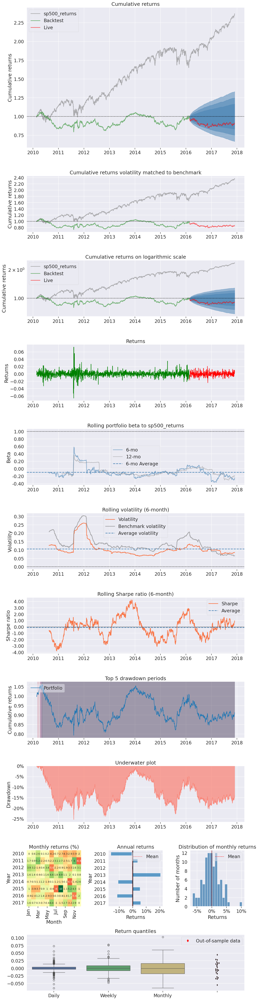

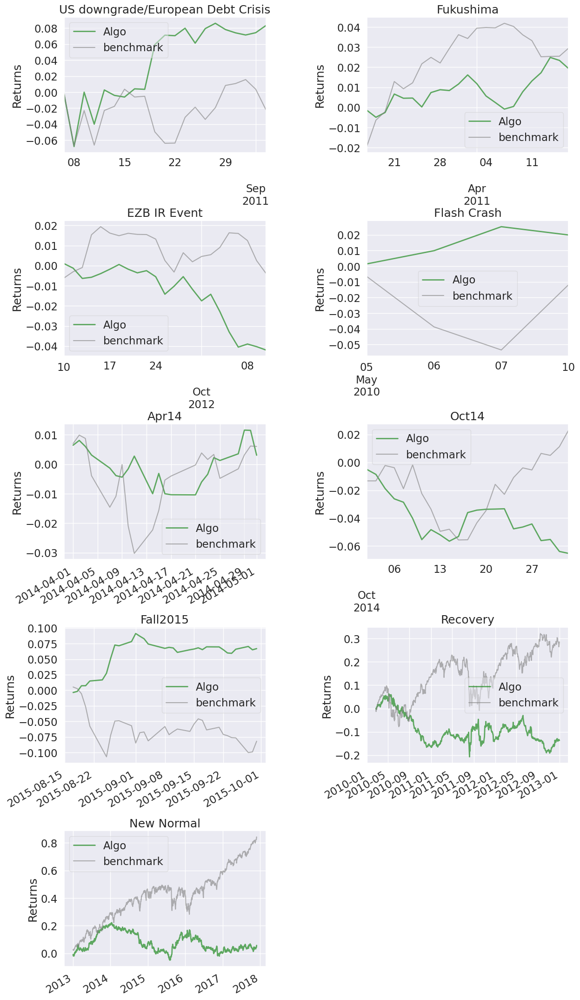

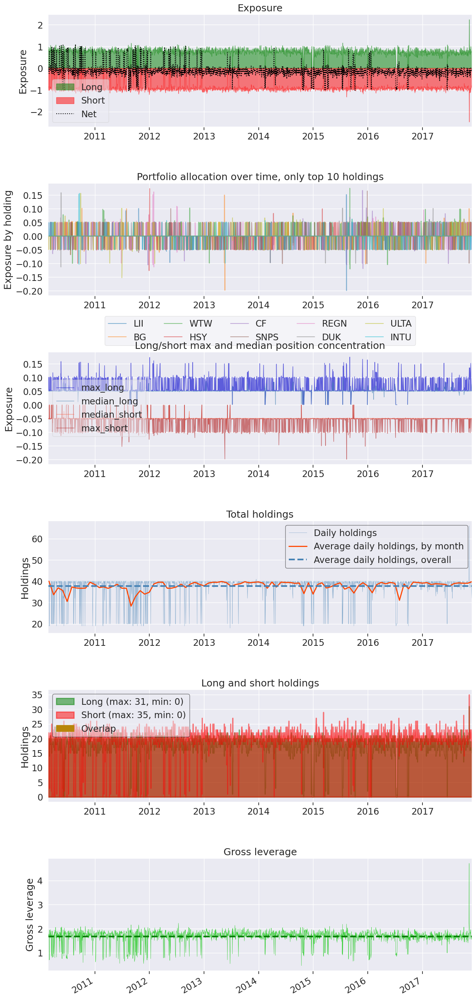

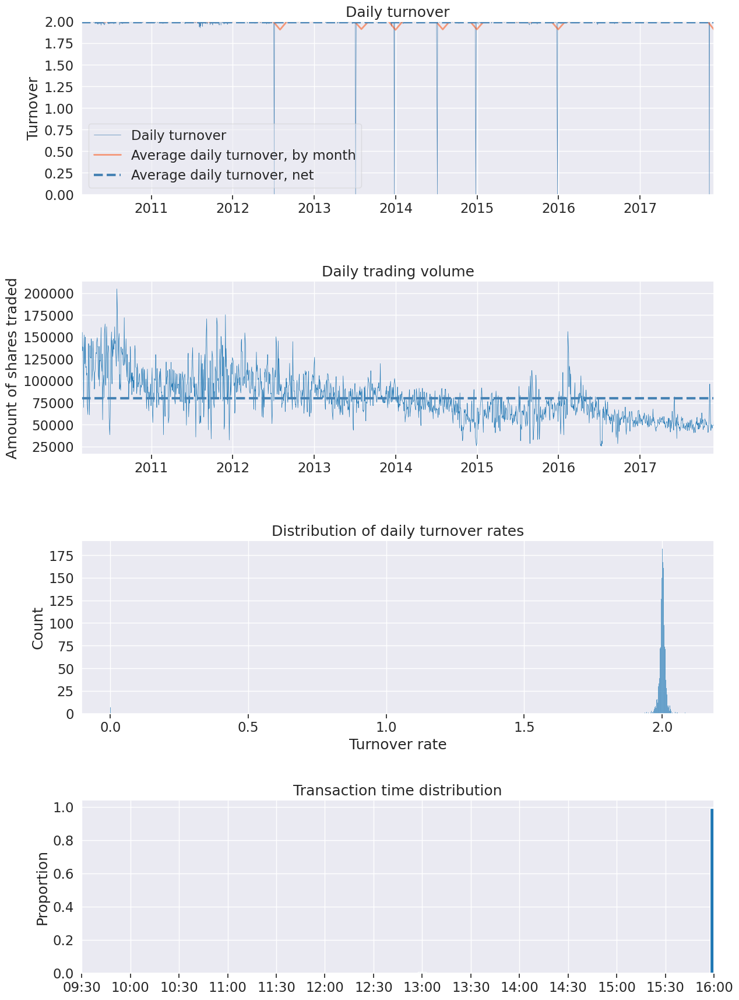

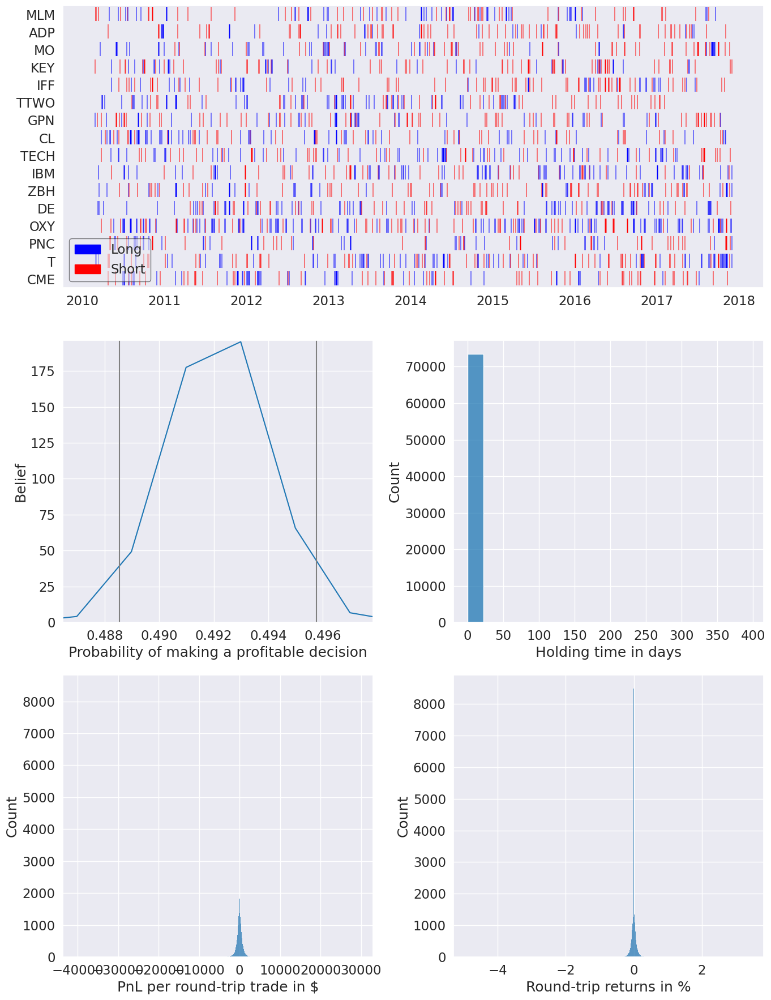

In [21]:
pf.create_full_tear_sheet(
    returns,
    positions=positions,
    transactions=transactions,
    benchmark_rets=benchmark_data,
    live_start_date=LIVE_DATE,
    round_trips=True
)

## Trading Strategy-III:

### As per the Signal Evaluation of the Combined Model Factors, we will long and short predictions in quantiles 1 and 4 respectively.

In [22]:
trading_strategy={
    "strategy":"quantile_based",
    "values":{
        "quantile_long":1,
        "quantile_short":4
}

}

In [23]:
backtester=BackTester(
    n_longs=20,
    n_shorts=20,
    min_positions=10,
    capital_base=1e6,
    commission_cost=0.00075,
    commission_min_trade_cost=0.01,
    slippage_spread=0.0,
    predictions_file=os.path.join(data_store,"factors.csv"),
    predictions_column_name="Combined_Factor",
    trading_strategy=trading_strategy
)

In [24]:
results=backtester.run_backtesting()

[INFO]: Model predictions loaded...
[INFO]: Missing Date Values added in Model Predictions...
[INFO]: Model Data Loader created...
[INFO]: Backtesting started for trading strategy-II...
[INFO]: Backtesting completed...


### Performance analysis using Pyfolio

#### Extracting information from Zipline Results

In [25]:
returns,positions,transactions=pf.utils.extract_rets_pos_txn_from_zipline(results)

#### Plotting Rolling Returns and Sharpe Ratio

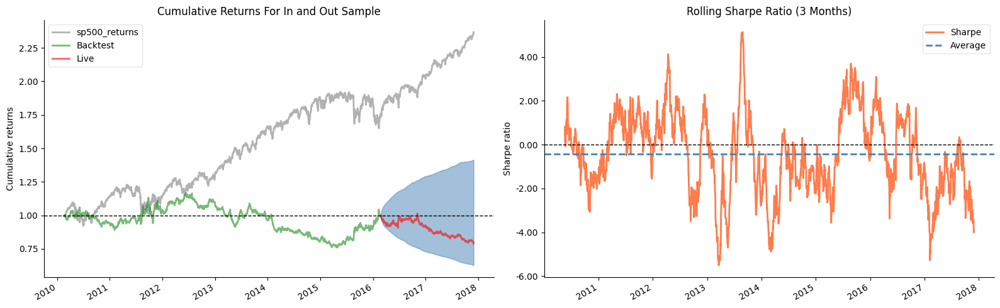

In [26]:
fig,axes=plt.subplots(ncols=2,figsize=(16,5))

plot_rolling_returns(
    returns,
    factor_returns=benchmark_data,
    live_start_date=LIVE_DATE,
    logy=False,
    cone_std=2,
    legend_loc="best",
    volatility_match=False,
    cone_function=forecast_cone_bootstrap,
    ax=axes[0]
)

plot_rolling_sharpe(returns,rolling_window=63,ax=axes[1])

axes[0].set_title("Cumulative Returns For In and Out Sample")
axes[1].set_title("Rolling Sharpe Ratio (3 Months)")

sns.despine()
fig.tight_layout()

#### Full Tear Sheet

Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,34.92,2012-06-13,2015-04-28,NaT,NaN
1,16.86,2011-09-27,2011-10-28,2012-05-30,177
2,15.79,2010-06-07,2011-02-04,2011-08-19,315
3,5.76,2011-08-19,2011-08-31,2011-09-15,20
4,5.34,2010-04-16,2010-05-03,2010-05-27,30


Stress Events,mean,min,max
US downgrade/European Debt Crisis,0.46%,-3.39%,5.08%
Fukushima,0.03%,-1.19%,1.48%
EZB IR Event,0.03%,-1.11%,1.29%
Flash Crash,0.38%,-0.14%,0.68%
Apr14,0.03%,-1.21%,1.73%
Oct14,-0.19%,-1.97%,2.45%
Fall2015,0.35%,-2.92%,3.71%
Recovery,0.02%,-5.57%,5.08%
New Normal,-0.02%,-2.92%,4.71%


Top 10 long positions of all time,max
sid,
CMI,17.74%
HPQ,15.67%
HAS,15.33%
NTAP,15.28%
EXPE,15.26%
NDSN,15.17%
YUM,15.10%
PKG,14.83%
LII,14.76%


Top 10 short positions of all time,max
sid,
HAS,-20.23%
PH,-16.43%
WDC,-16.41%
INCY,-16.25%
DHI,-15.63%
COP,-15.61%
PCG,-15.38%
STZ,-15.37%
CHD,-15.27%


Top 10 positions of all time,max
sid,
HAS,20.23%
CMI,17.74%
PH,16.43%
WDC,16.41%
INCY,16.25%
HPQ,15.67%
DHI,15.63%
COP,15.61%
PCG,15.38%


Summary stats,All trades,Short trades,Long trades
Total number of round_trips,50540.00,36033.00,14507.00
Percent profitable,0.49,0.48,0.52
Winning round_trips,24774.00,17186.00,7588.00
Losing round_trips,25329.00,18563.00,6766.00
Even round_trips,437.00,284.00,153.00


PnL stats,All trades,Short trades,Long trades
Total profit,$45331.58,$-827052.38,$872383.96
Gross profit,$13919213.70,$9143398.96,$4775814.74
Gross loss,$-13873882.12,$-9970451.34,$-3903430.78
Profit factor,$1.00,$0.92,$1.22
Avg. trade net profit,$0.90,$-22.95,$60.14
Avg. winning trade,$561.85,$532.03,$629.39
Avg. losing trade,$-547.75,$-537.11,$-576.92
Ratio Avg. Win:Avg. Loss,$1.03,$0.99,$1.09
Largest winning trade,$44110.80,$44110.80,$15884.80
Largest losing trade,$-33712.90,$-14091.84,$-33712.90


Duration stats,All trades,Short trades,Long trades
Avg duration,1 days 15:59:29.512861100,1 days 12:39:00.654400133,2 days 00:17:27.217205487
Median duration,1 days 00:00:00,1 days 00:00:00,1 days 00:00:00
Longest duration,172 days 00:00:00,172 days 00:00:00,156 days 23:00:00
Shortest duration,0 days 00:00:00,0 days 00:00:00,0 days 00:00:00


Return stats,All trades,Short trades,Long trades
Avg returns all round_trips,0.00%,-0.00%,0.01%
Avg returns winning,0.06%,0.06%,0.06%
Avg returns losing,-0.06%,-0.06%,-0.06%
Median returns all round_trips,-0.00%,-0.00%,0.00%
Median returns winning,0.04%,0.04%,0.04%
Median returns losing,-0.04%,-0.04%,-0.03%
Largest winning trade,4.48%,4.48%,1.61%
Largest losing trade,-3.59%,-1.40%,-3.59%


Symbol stats,A,ACGL,ACN,ADI,ADM,ADP,ADSK,AEE,AEP,AES,AFL,AIG,AIZ,AJG,ALB,ALGN,ALL,AMAT,AMD,AME,AMGN,AMP,AMT,AON,AOS,APA,APD,APH,ARE,ATO,AVB,AVGO,AVY,AWK,AXP,AZO,BA,BAC,BAX,BBY,BDX,BEN,BG,BIIB,BK,BLDR,BLK,BMY,BR,BRO,BSX,BXP,C,CAG,CAH,CAT,CB,CCI,CCL,CDNS,CF,CHD,CHRW,CI,CINF,CL,CLX,CME,CMG,CMI,CMS,CNC,CNP,COF,COO,COP,CPB,CPRT,CPT,CRL,CRM,CSCO,CSGP,CSX,CTAS,CTSH,CVS,CVX,D,DAL,DE,DECK,DG,DGX,DHI,DHR,DIS,DLR,DLTR,DOV,DPZ,DRI,DTE,DUK,DVA,DVN,DXCM,EA,EBAY,ECL,ED,EFX,EIX,EL,EMN,EMR,EOG,EQIX,EQR,EQT,ERIE,ES,ESS,ETN,ETR,EW,EXC,EXPD,EXPE,EXR,F,FCX,FDS,FDX,FE,FFIV,FICO,FIS,FITB,FOX,FOXA,FRT,FTNT,GD,GE,GILD,GIS,GLW,GOOGL,GPC,GPN,GRMN,GS,GWW,HAL,HAS,HBAN,HD,HIG,HOLX,HON,HPQ,HRL,HSIC,HST,HSY,HUM,IBM,ICE,IDXX,IEX,IFF,INCY,INTU,IP,IPG,IR,IRM,ISRG,IT,ITW,IVZ,JBHT,JBL,JCI,JKHY,JNJ,JPM,K,KEY,KIM,KLAC,KMB,KMX,KO,KR,L,LDOS,LEN,LH,LII,LKQ,LLY,LMT,LNT,LRCX,LUV,LVS,LYV,MA,MAA,MAR,MAS,MCD,MCHP,MCK,MCO,MDLZ,MDT,MET,MGM,MHK,MKC,MKTX,MLM,MMC,MNST,MO,MOH,MOS,MPWR,MRK,MS,MSCI,MSFT,MSI,MTB,MTD,MU,NDAQ,NDSN,NEE,NEM,NFLX,NI,NKE,NOC,NRG,NSC,NTAP,NTRS,NUE,NVDA,NVR,O,ODFL,OKE,OMC,ORCL,ORLY,OXY,PAYX,PCAR,PCG,PEG,PEP,PFE,PFG,PG,PGR,PH,PHM,PKG,PLD,PM,PNC,PNR,PNW,PODD,POOL,PPG,PPL,PRU,PSA,PWR,RCL,REG,REGN,RF,RJF,RL,RMD,ROK,ROL,ROP,ROST,RSG,SBAC,SBUX,SCHW,SHW,SJM,SLB,SMCI,SNA,SNPS,SO,SPG,SRE,STE,STLD,STT,STX,STZ,SWK,SWKS,SYK,SYY,T,TAP,TDG,TDY,TECH,TEL,TER,TGT,TJX,TMO,TMUS,TRMB,TROW,TSCO,TSN,TTWO,TXN,TXT,TYL,UAL,UDR,UHS,ULTA,UNH,UNP,UPS,URI,USB,V,VLO,VMC,VRSK,VRSN,VRTX,VTR,VZ,WAB,WAT,WBA,WDC,WEC,WFC,WM,WMB,WMT,WRB,WSM,WST,WTW,WY,WYNN,XEL,XOM,YUM,ZBH,ZBRA
Avg returns all round_trips,0.01%,0.00%,0.01%,0.01%,0.01%,-0.01%,0.00%,0.00%,-0.01%,0.01%,-0.01%,-0.01%,0.01%,-0.00%,-0.00%,-0.03%,0.00%,0.01%,-0.02%,0.01%,-0.01%,0.01%,0.01%,0.00%,-0.00%,-0.01%,0.00%,-0.00%,0.00%,-0.00%,-0.01%,-0.00%,0.00%,0.00%,0.00%,-0.00%,0.01%,-0.00%,-0.00%,0.00%,0.00%,-0.00%,0.00%,-0.01%,-0.00%,-0.01%,-0.00%,-0.01%,0.00%,-0.00%,0.01%,-0.01%,-0.00%,0.00%,0.00%,0.01%,-0.00%,-0.00%,-0.01%,0.01%,-0.00%,-0.00%,0.00%,0.02%,-0.00%,0.00%,0.00%,0.00%,-0.01%,0.00%,-0.01%,-0.00%,-0.00%,-0.00%,0.01%,-0.01%,-0.00%,-0.03%,0.01%,0.00%,0.01%,0.00%,-0.01%,0.00%,-0.00%,0.01%,-0.00%,-0.01%,-0.00%,0.00%,0.00%,0.01%,0.01%,0.00%,-0.01%,0.00%,-0.00%,-0.01%,-0.00%,0.01%,0.00%,0.00%,-0.00%,-0.01%,0.00%,-0.01%,0.00%,-0.00%,0.01%,-0.00%,-0.01%,0.00%,0.01%,-0.01%,-0.01%,-0.00%,0.01%,-0.00%,0.00%,-0.00%,-0.00%,-0.00%,0.00%,-0.01%,0.01%,-0.01%,0.00%,0.01%,0.01%,-0.00%,0.01%,0.01%,-0.01%,0.00%,-0.01%,0.00%,0.01%,-0.01%,-0.00%,0.01%,-0.01%,0.00%,0.02%,0.00%,0.02%,0.00%,0.01%,0.00%,-0.00%,-0.01%,0.00%,-0.01%,0.00%,-0.01%,0.00%,0.01%,0.00%,0.00%,-0.01%,0.00%,-0.01%,-0.01%,0.01%,-0.00%,-0.00%,0.00%,-0.00%,0.00%,0.01%,-0.00%,-0.01%,0.00%,0.01%,-0.01%,0.00%,-0.01%,0.01%,0.00%,0.00%,-0.00%,0.00%,0.00%,0.01%,0.01%,0.01%,-0.01%,-0.01%,-0.01%,-0.00%,0.01%,0.00%,-0.01%,-0.00%,-0.01%,0.00%,-0.00%,0.01%,-0.00%,-0.00%,0.00%,-0.00%,-0.00%,-0.01%,0.00%,-0.01%,-0.01%,0.01%,0.01%,-0.01%,0.05%,-0.00%,-0.00%,0.00%,-0.00%,0.01%,-0.00%,-0.01%,-0.00%,-0.00%,0.01%,0.01%,0.01%,-0.01%,-0.01%,-0.01%,0.00%,0.00%,-0.01%,-0.01%,0.01%,0.02%,0.00%,0.01%,-0.00%,0.00%,0.00%,0.00%,-0.00%,-0.01%,0.00%,-0.00%,-0.00%,0.00%,0.02%,-0.01%,0.01%,-0.02%,-0.00%,0.01%,-0.01%,-0.01%,-0.01%,-0.01%,0.00%,0.00%,0.00%,0.02%,-0.01%,-0.01%,-0.01%,0.00%,-0.01%,-0.00%,0.00%,0.00%,-0.00%,0.00%,-0.00%,-0.01%,-0.00%,-0.00%,0.01%,0.00%,0.02%,0.00%,0.01%,0.00%,-0.01%,0.00%,0.00%,0.00%,-0.00%,-0.00%,-0.01%,0.02%,0.00%,-0.01%,0.01%,-0.00%,-0.00%,0.01%,0.00%,-0.02%,-0.01%,-0.00%,-0.01%,-0.01%,0.01%,-0.00%,-0.02%,-0.01%,0.00%,-0.01%,-0.00%,0.01%,-0.01%,-0.00%,0.01%,0.00%,0.00%,-0.01%,0.00%,0.00%,-0.01%,-0.01%,0.01%,-0.00%,-0.01%,-0.00%,-0.00%,-0.01%,-0.01%,-0.00%,0.01%,-0.00%,0.00%,0.00%,0.01%,0.01%,0.00%,-0.00%,0.01%,-0.00%,-0.00%,-0.00%,0.00%,-0.00%,0.01%,0.00%,-0.01%,-0.00%,0.00%,-0.01%,-0.01%,-0.02%,0.01%,0.00%,-0.02%,-0.02%,0.01%,-0.00%,-0.01%,-0.01%,-0.01%,0.02%,0.00%,-0.01%,-0.00%,-0.00%,-0.00%,0.00%,0.02%,0.00%,-0.00%,0.00%,-0.00%,-0.00%,0.00%,0.03%,-0.01%,0.00%,0.00%,0.01%,-0.00%


Profitability (PnL / PnL total) per name,
symbol,
MA,173.05%
NFLX,79.26%
PWR,79.08%
OKE,76.55%
FTNT,72.51%
WAB,68.98%
WYNN,64.47%
NKE,55.71%
AES,53.57%


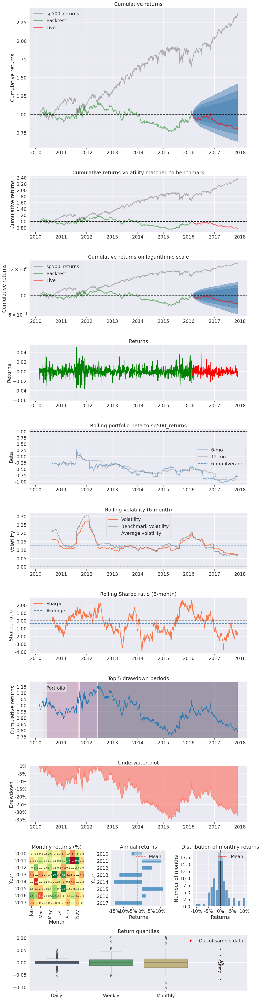

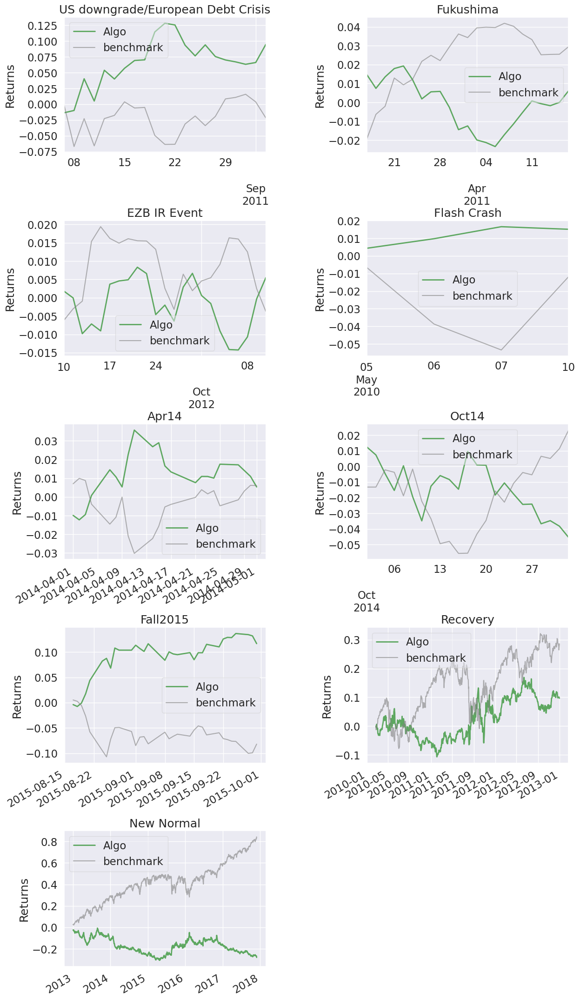

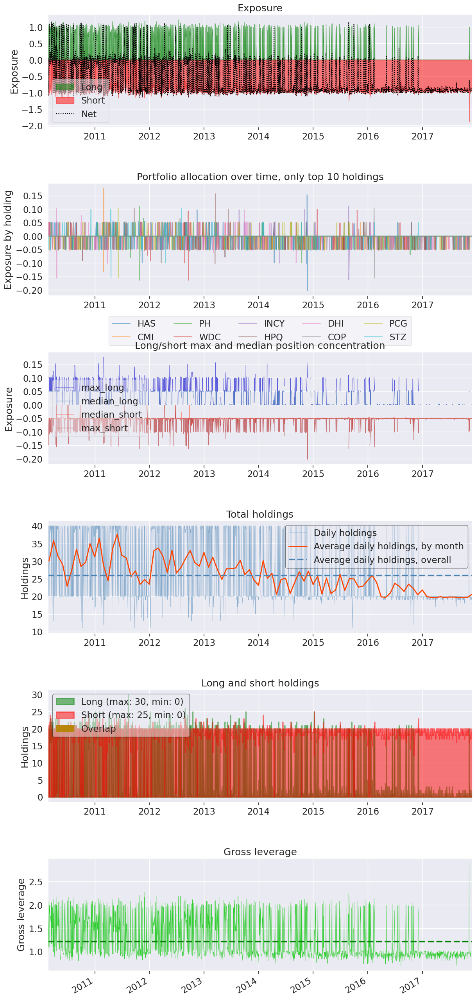

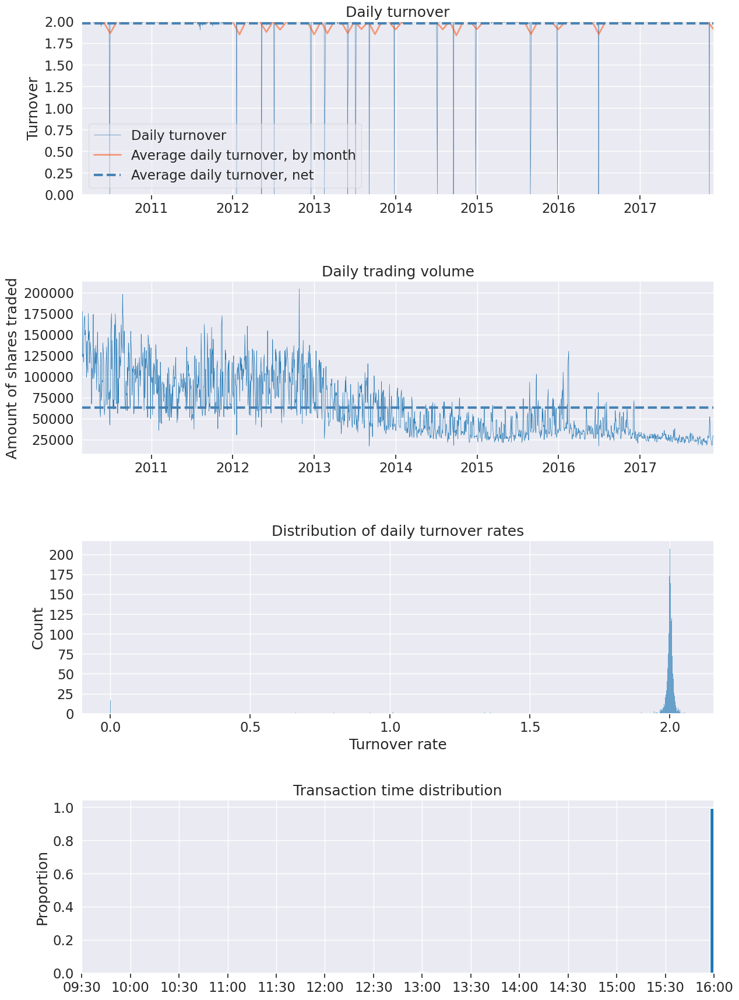

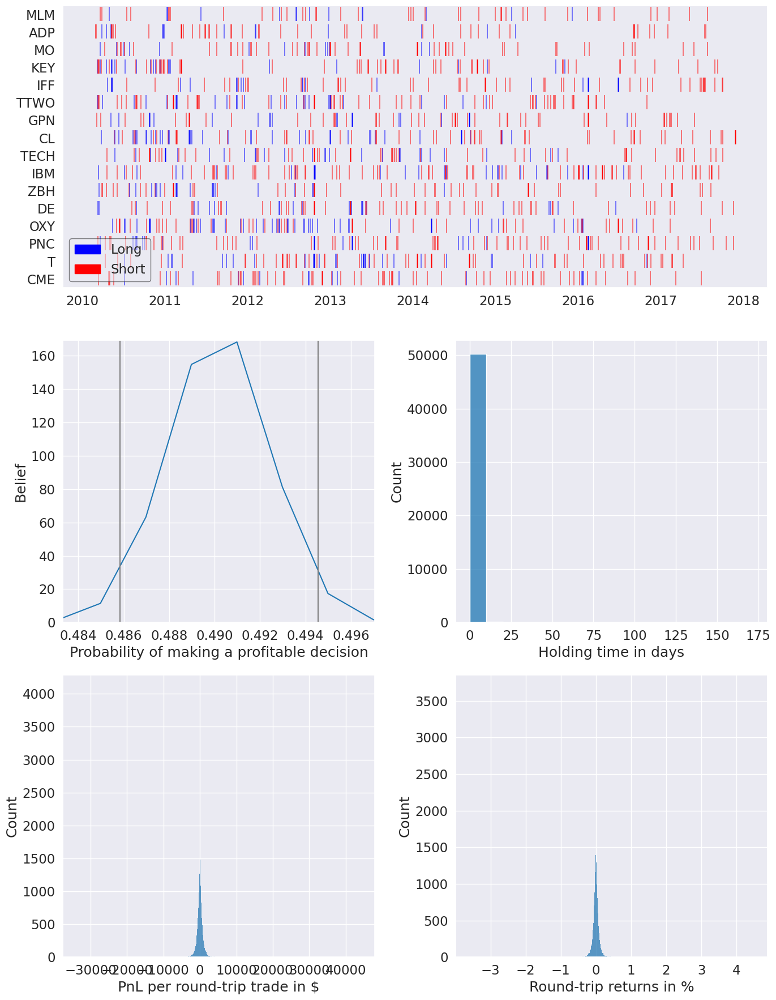

In [27]:
pf.create_full_tear_sheet(
    returns,
    positions=positions,
    transactions=transactions,
    benchmark_rets=benchmark_data,
    live_start_date=LIVE_DATE,
    round_trips=True
)